In [1]:
import os
import sys
import pytz
import argparse
# import jax.numpy as jnp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from geopy import distance
import datetime
import tilemapbase
from copy import deepcopy
import pickle as pkl
from PIL import Image
import skimage.measure
import math
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')
os.environ['PYTHONWARNINGS']='ignore'
# import hyperopt
# from joblib import Parallel, delayed
# import random
# random.seed(42)
# import scipy
# import torch
# from pykrige.ok import OrdinaryKriging
# from pykrige.ok3d import OrdinaryKriging3D
# from pykrige.uk import UniversalKriging
# from sklearn.model_selection import train_test_split
# from scipy.interpolate import CubicSpline

In [2]:
# source = 'combined'
sensor = 'pm25'
res_time = '1H'
filepath_root = '/scratch/ab9738/pollution_with_sensors/'

filepath_data_kai = filepath_root+'data/kaiterra/kaiterra_fieldeggid_{}_current_panel.csv'.format(res_time)
filepath_data_gov = filepath_root+'data/govdata/govdata_{}_current.csv'.format(res_time)
filepath_locs_kai = filepath_root+'data/kaiterra/kaiterra_locations.csv'
filepath_locs_gov = filepath_root+'data/govdata/govdata_locations.csv'

locs_kai = pd.read_csv(filepath_locs_kai, index_col=[0])
locs_kai['Type'] = 'Kaiterra'
locs_gov = pd.read_csv(filepath_locs_gov, index_col=[0])
locs_gov['Type'] = 'Govt'
locs = pd.merge(locs_kai, locs_gov, how='outer',\
                on=['Monitor ID', 'Latitude', 'Longitude', 'Location', 'Type'], copy=False)
data_kai = pd.read_csv(filepath_data_kai, index_col=[0,1], parse_dates=True)[sensor]
data_gov = pd.read_csv(filepath_data_gov, index_col=[0,1], parse_dates=True)[sensor]
data = pd.concat([data_kai, data_gov], axis=0, copy=False)
data.replace(0,np.nan,inplace=True)

start_dt = data.index.levels[1][0]
end_dt = data.index.levels[1][-1]

if start_dt.tzname != 'IST':
        if start_dt.tzinfo is None:
            start_dt = start_dt.tz_localize('UTC')
        start_dt = start_dt.tz_convert(pytz.FixedOffset(330))
    
if end_dt.tzname != 'IST':
    if end_dt.tzinfo is None: 
        end_dt = end_dt.tz_localize('UTC')
    end_dt = end_dt.tz_convert(pytz.FixedOffset(330))

# now, filter through the start and end dates
data.sort_index(inplace=True)
data = data.loc[(slice(None), slice(start_dt, end_dt))]

# if(source=='govdata'):
df_gov = data_gov.unstack(level=0)
# elif(source=='kaiterra'):
df_kai = data_kai.unstack(level=0)
# else:
df = data.unstack(level=0)
distances = pd.read_csv('/scratch/ab9738/pollution_with_sensors/data/combined_distances.csv', index_col=[0])
distances = distances.loc[df.columns, df.columns]
distances[distances == 0] = np.nan

In [3]:
df = df.drop(['Pusa_IMD'], axis=1)

In [4]:
df = df.groupby(df.index.date).mean()

In [5]:
df.index = pd.to_datetime(df.index)

In [6]:
df_2018 = df[df.index.year==2018]
df_2019 = df[df.index.year==2019]
df_2020 = df[df.index.year==2020]

In [7]:
def process_month(df_hsps, df_month, month, year):
    df_hsps.loc[str(month)+'-'+str(year)] = np.zeros(len(df.columns))
    for sensor in df_month.columns:
        if(df_month[sensor].isna().sum()>10):
            continue
        if(len(df_month[sensor][df_month[sensor]>60])>0.6*len(df_month[sensor].dropna())):
            df_hsps.loc[str(month)+'-'+str(year)][sensor] = 1
        if(df_month[sensor].mean()>90):
            df_hsps.loc[str(month)+'-'+str(year)][sensor] = 1
        y = df_month[sensor].dropna()
        y = y-60
        y = (y>0).astype(int)
        y = y * (y.groupby((y != y.shift()).cumsum()).cumcount() + 1)
        if(max(y)>=3):
            df_hsps.loc[str(month)+'-'+str(year)][sensor] = 1   

In [8]:
df_hsps = pd.DataFrame(columns=df.columns)
for month in range(5,13):
    df_month = df_2018[df_2018.index.month==month]    
    process_month(df_hsps, df_month, month, 2018)
    
for month in range(1,13):
    df_month = df_2019[df_2019.index.month==month]    
    process_month(df_hsps, df_month, month, 2019)
    
for month in range(1,10):
    df_month = df_2020[df_2020.index.month==month]    
    process_month(df_hsps, df_month, month, 2020)

In [9]:
df_hsps

field_egg_id,113E,1FD7,20CA,2E9C,3ACF,498F,4BE7,56C3,5D7A,603A,...,PunjabiBagh_DPCC,Pusa_DPCC,RKPuram_DPCC,Rohini_DPCC,Shadipur_CPCB,Sirifort_CPCB,SoniaVihar_DPCC,SriAurobindoMarg_DPCC,VivekVihar_DPCC,Wazirpur_DPCC
5-2018,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0
6-2018,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0
7-2018,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0
8-2018,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
9-2018,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0
10-2018,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
11-2018,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
12-2018,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1-2019,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2-2019,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [10]:
df_num_hsps = df_hsps.sum(axis=0)

In [49]:
df_pop = pd.read_csv('../source_apportionment/pop_dens_cells.txt', sep=' ', header=None)
df_pop = df_pop.iloc[int(((90-28.78)/90)*10800):int(((90-28.39)/90)*10800), int((77.01/90)*10800):int((77.40/90)*10800)]
pop_matrix = df_pop.to_numpy()
print(pop_matrix.shape)

(47, 47)


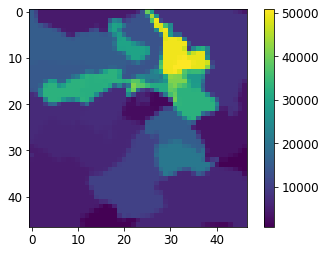

In [52]:
def heatmap2d(arr: np.ndarray):
    fig = plt.figure()
    plt.imshow(arr, cmap='viridis', origin='upper')
    plt.colorbar()
    plt.show()
    plt.close(fig)
    
heatmap2d(pop_matrix)

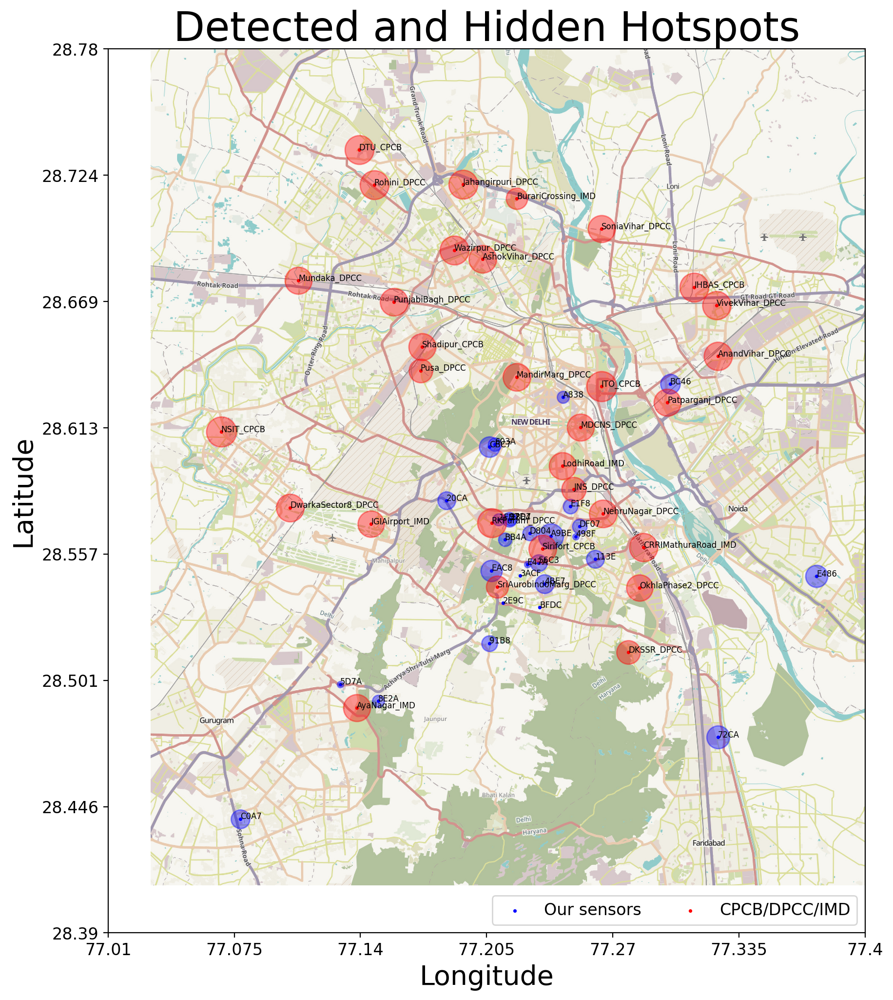

In [14]:
region_lat_b, region_lat_t, region_long_l, region_long_r = 28.39, 28.78, 77.01, 77.40
# region_lat_b, region_lat_t, region_long_l, region_long_r = 28.20, 29.00, 76.85, 77.65
subset_locs = locs[(locs['Latitude']<region_lat_t) & (locs['Latitude']>region_lat_b) &\
                   (locs['Longitude']<region_long_r) & (locs['Longitude']>region_long_l)]
subset_locs = subset_locs.loc[df_hsps.columns]
lat_lims = region_lat_b, region_lat_t
lon_lims = region_long_l, region_long_r
lat_center, lon_center = (region_lat_b + region_lat_t)/2, (region_long_l + region_long_r)/2

extent = tilemapbase.Extent.from_lonlat(region_long_l, region_long_r, region_lat_b, region_lat_t)
extent_proj = extent.to_project_3857

# use openstreetmap (OSM)
t = tilemapbase.tiles.build_OSM_Humanitarian()

colordict = {'Kaiterra':'blue','Govt':'red'}

plt.rc('font', size=12)

fig, ax = plt.subplots(figsize=(12,12), dpi=200)
ax.xaxis.set_visible(True)
ax.yaxis.set_visible(True)

plotter = tilemapbase.Plotter(extent, t, width=600)
plotter.plot(ax, t)

for row in subset_locs.itertuples():
    x, y = tilemapbase.project(row.Longitude, row.Latitude)
    if row.Type == 'Kaiterra':
        obj1 = ax.scatter(x, y, marker='.', color='blue', s=10, label='Our sensors')
        obj3 = ax.scatter(x, y, marker='.', color='blue', s=10+df_num_hsps[row.Index]*75, alpha=0.4)
    else:
        obj2 = ax.scatter(x, y, marker='.', color='red', s=10, label='CPCB/DPCC/IMD')
        obj4 = ax.scatter(x, y, marker='.', color='red', s=10+df_num_hsps[row.Index]*75, alpha=0.4)
    ax.text(x, y, row.Index, fontsize=6)

ax.legend((obj1, obj2), (obj1.get_label(), obj2.get_label()), loc='lower right', ncol=2)
plt.xticks(plt.xticks()[0],np.round(np.linspace(region_long_l,region_long_r, 7),3))
plt.yticks(plt.yticks()[0],np.round(np.linspace(region_lat_t,region_lat_b, 8),3))
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
plt.title('Detected and Hidden Hotspots', fontsize=30)
fig.savefig('locs_map.png',bbox_inches='tight')
plt.show()
plt.close(fig)

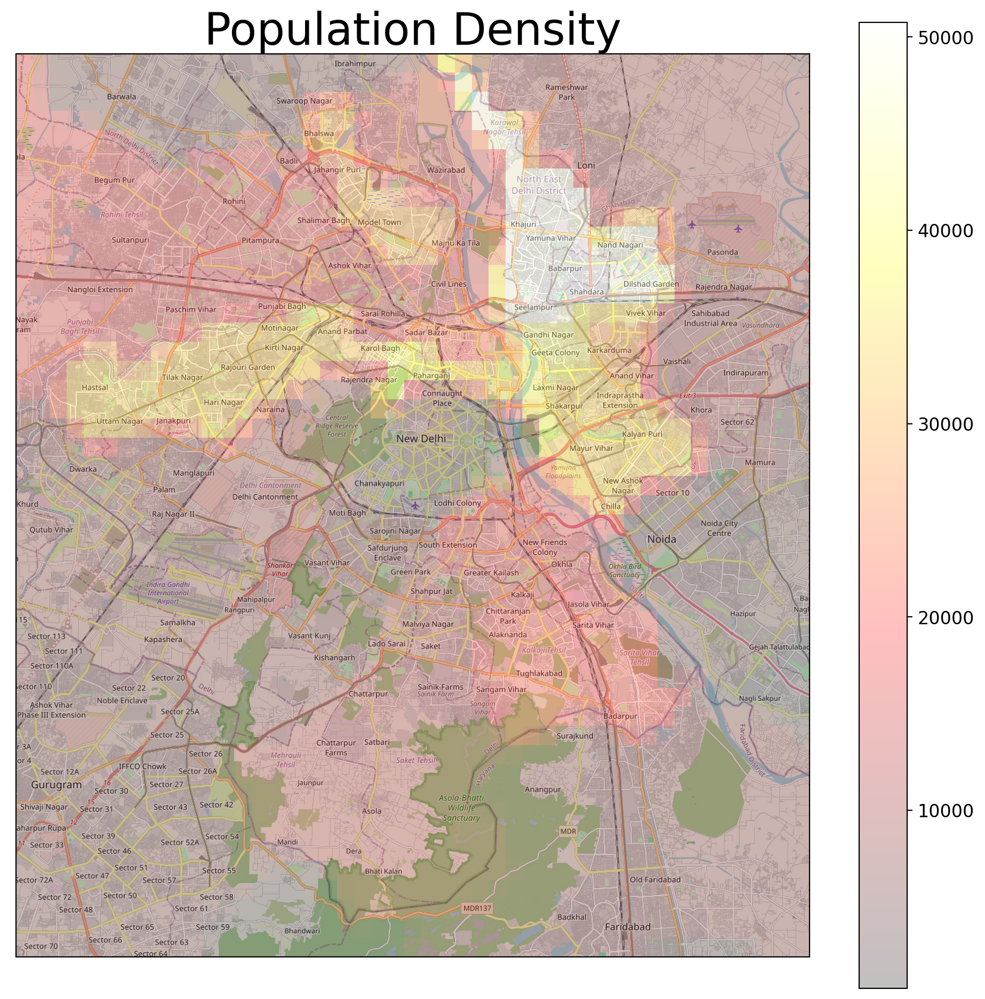

In [62]:
t = tilemapbase.tiles.build_OSM()
fig, ax = plt.subplots(figsize=(12,12), dpi=200)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

plotter = tilemapbase.Plotter(extent, t, width=600)
plotter.plot(ax, t)
extent_mat = extent.xmin, extent.xmax, extent.ymax, extent.ymin
plt.imshow(pop_matrix, cmap='hot', alpha=0.25, extent=extent_mat)
plt.colorbar()
plt.title('Population Density', fontsize=30)
fig.savefig('pop_map.png',bbox_inches='tight')
plt.show()
plt.close(fig)